## Problem Statement

#### Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

##### Importing the neccessary libraries

In [91]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
import pandas as pd
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings("ignore")
import seaborn as sn
import numpy as np
import scipy.stats as stats
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import f1_score
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import RidgeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import Lasso
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import LassoLars
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import SGDClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score,roc_curve
from sklearn.impute import KNNImputer
from sklearn.utils import resample
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.semi_supervised import LabelSpreading,LabelPropagation
from sklearn.ensemble import AdaBoostClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis,LinearDiscriminantAnalysis
from sklearn.calibration import CalibratedClassifierCV
from sklearn.svm import LinearSVC,NuSVC
from sklearn.linear_model import RidgeClassifierCV,PassiveAggressiveClassifier,Perceptron
from sklearn.naive_bayes import GaussianNB,BernoulliNB
from sklearn.neighbors import NearestCentroid
from sklearn.dummy import DummyClassifier
from io import StringIO
from sklearn.tree import export_graphviz
from IPython.display import Image
import os
from sklearn.feature_selection import SelectKBest,chi2
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
import joblib
%matplotlib inline

###### Uploading the dataset

In [92]:
df=pd.read_csv('Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


### EDA

In [93]:
print('Number of rows x columns in dataset are:',df.shape)

Number of rows x columns in dataset are: (1000, 40)


In [94]:
print('Dataset contains any null values:',df.isnull().values.any())

Dataset contains any null values: True


In [95]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [96]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

#### There are 21 object type and 19 numeric type.
fraud_reported is target variable

In [97]:
for i in df.columns:
    if df[i].dtype == 'object':
        print(i)

policy_bind_date
policy_state
policy_csl
insured_sex
insured_education_level
insured_occupation
insured_hobbies
insured_relationship
incident_date
incident_type
collision_type
incident_severity
authorities_contacted
incident_state
incident_city
incident_location
property_damage
police_report_available
auto_make
auto_model
fraud_reported


#### Checking and treating missing values

In [98]:
for i in df.columns:
    if 0<len(df[df[i]=='?']):
        print(i)
        print(len(df[df[i]=='?']))

collision_type
178
property_damage
360
police_report_available
343


In [99]:
df = df.replace('?', np.nan)

df.isna().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                  178
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

<AxesSubplot:>

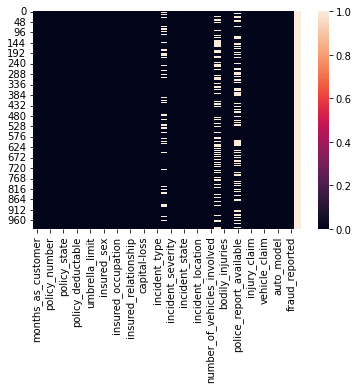

In [100]:
sn.heatmap(df.isna())

##### Missing values in collision, property_damage, police_report_available,_c39

In [101]:
df=df.drop(['_c39'],axis=1)

##### all the values pertaining _c39 column is empty which in turn does not contribute to target varaiable

In [102]:
df['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
Name: collision_type, dtype: int64

##### Collison type column contain 3 unique values namely "Rear collision", "side collision", "front collision"
We will replace the null value with most common collision type

In [103]:
df['collision_type'].fillna(df['collision_type'].mode()[0], inplace=True)

In [104]:
df['property_damage'].value_counts()

NO     338
YES    302
Name: property_damage, dtype: int64

#### property damage column contains only 2 values "YES" or "NO".
We can replace the null values with "NO", assuming no property damage.

In [105]:
df['property_damage'].fillna('NO', inplace=True)

In [106]:
df['police_report_available'].value_counts()

NO     343
YES    314
Name: police_report_available, dtype: int64

##### Property damage column contains only 2 values "YES" or "NO".
We can replace the null values with "NO", assuming no property damage.

In [107]:
df['police_report_available'].fillna('NO', inplace=True)

<AxesSubplot:>

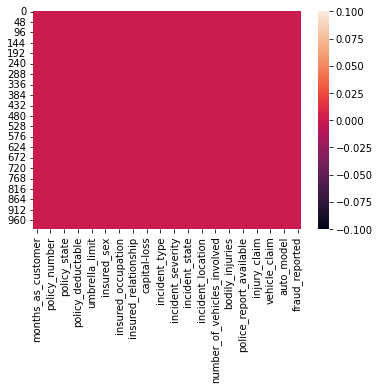

In [108]:
sn.heatmap(df.isna())

###### all null values filled 

In [109]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    3
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

##### "policy_number" and "incident_location" has unique values and not contributing to TARGET VARIABLE so we can drop this columns

##### insured zip is the postal zip code, with almost all unique features which doesn't relate in confirming the fraud opportunites

##### insured_hobbies is miscellanous data which is not at all related to target variable

##### auto_model is not need as we already have auto brand 

In [110]:
df=df.drop(['policy_number','incident_location','insured_zip','insured_hobbies','auto_model'],axis=1)

In [111]:
df.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,MALE,MD,...,1,2,YES,71610,6510,13020,52080,Saab,2004,Y
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,MALE,MD,...,0,0,NO,5070,780,780,3510,Mercedes,2007,Y
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,FEMALE,PhD,...,2,3,NO,34650,7700,3850,23100,Dodge,2007,N
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,FEMALE,PhD,...,1,2,NO,63400,6340,6340,50720,Chevrolet,2014,Y
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,MALE,Associate,...,0,1,NO,6500,1300,650,4550,Accura,2009,N


In [112]:
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


##### Huge difference in quartile range of some column and huge standard devaition which indicates outliers present in dataset

##### Univariate Analysis

N    753
Y    247
Name: fraud_reported, dtype: int64


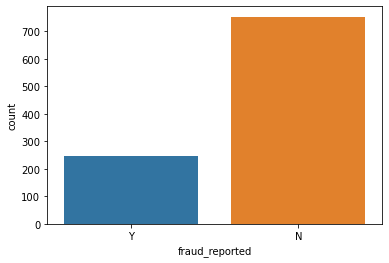

In [113]:
sn.countplot(x='fraud_reported',data=df)
print(df['fraud_reported'].value_counts())

##### Class Imbalance in target variable

<AxesSubplot:ylabel='police_report_available'>

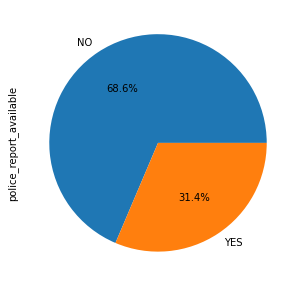

In [114]:
df['police_report_available'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

##### 31.4% only have police_report_available and rest not

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


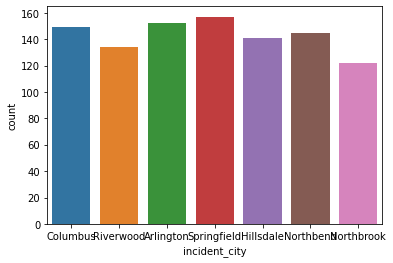

In [115]:
sn.countplot(x='incident_city',data=df)
print(df['incident_city'].value_counts())

##### Riverwood & Northbrook have less insurance claim couts

<AxesSubplot:ylabel='incident_type'>

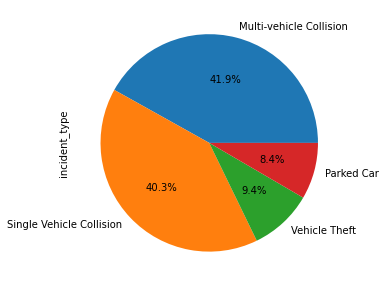

In [116]:
df['incident_type'].value_counts().plot.pie(figsize = (5,5), autopct = '%.1f%%')

##### Insurance claim are maximum  with Single & Multi-Vehicle Collision 

1    258
2    250
0    249
3    243
Name: witnesses, dtype: int64

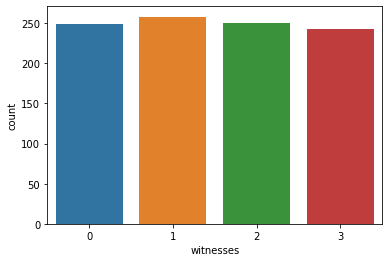

In [117]:
sn.countplot(x=df['witnesses'])
df.witnesses.value_counts()

##### All witness data seems to similar yet there is max chance of having atleast 1 witness 

#### Bivariate analysis

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

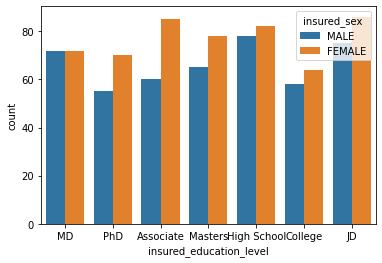

In [118]:
sn.countplot(df['insured_education_level'], hue=df['insured_sex'])

##### Female have mostly applied for insurance claims 

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

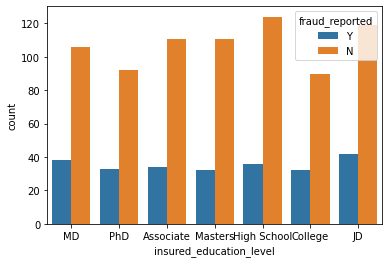

In [119]:
sn.countplot(df['insured_education_level'], hue=df['fraud_reported'])

##### Highly Educated people have reportes less insurance frauds

<AxesSubplot:xlabel='property_damage', ylabel='count'>

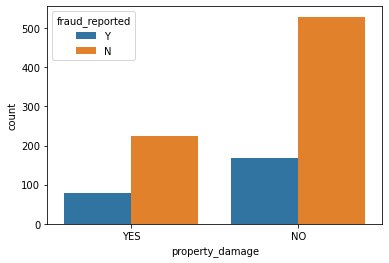

In [120]:
sn.countplot(df['property_damage'], hue=df['fraud_reported'])

##### No property damage has seen more fraud reported than the ones with propert daamges

<AxesSubplot:xlabel='bodily_injuries', ylabel='count'>

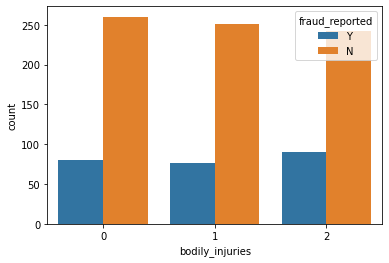

In [121]:
sn.countplot(df['bodily_injuries'], hue=df['fraud_reported'])

##### In all the "bodily_injuries" irrespective zero, one and two, most of them have "No Fraud Cases"

<AxesSubplot:xlabel='insured_relationship', ylabel='count'>

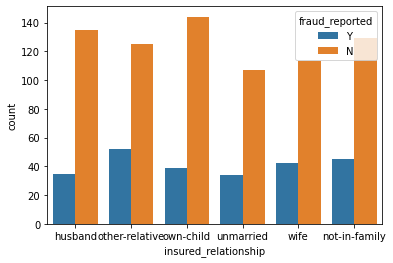

In [122]:
sn.countplot(df['insured_relationship'], hue=df['fraud_reported'])

##### In all the "insured_relationship" category, the highest number has most of them "No Fraud Cases"

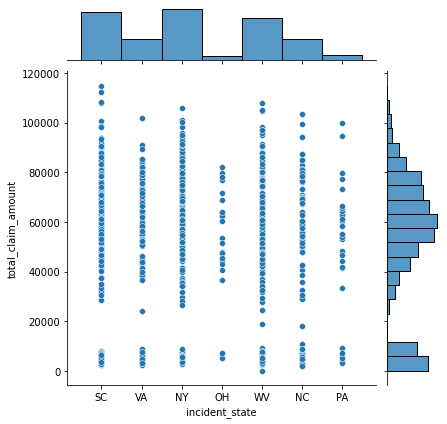

In [123]:
sn.jointplot(x=df['incident_state'], y=df['total_claim_amount'])

##### OH" and "PA" can be seen with less number of claims

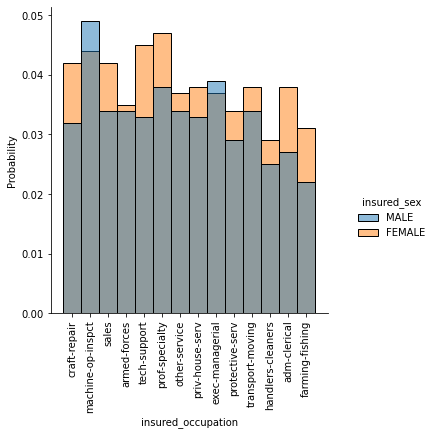

In [124]:
sn.displot(df, x="insured_occupation", hue="insured_sex", stat="probability")
plt.xticks(rotation=90)
plt.show()

##### Insurance claims are high in number for "Insured_occupation: Machine-op-inspect" where there are only the male candidates who has applied

#### Converting categorical into numerical type

In [125]:
for col in df.columns:
    if df[col].dtypes == 'object':
        encoder = LabelEncoder()
        df[col] = encoder.fit_transform(df[col])
df

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
0,328,48,532,2,1,1000,1406.91,0,1,4,...,1,2,1,71610,6510,13020,52080,10,2004,1
1,228,42,821,1,1,2000,1197.22,5000000,1,4,...,0,0,0,5070,780,780,3510,8,2007,1
2,134,29,186,2,0,2000,1413.14,5000000,0,6,...,2,3,0,34650,7700,3850,23100,4,2007,0
3,256,41,766,0,1,2000,1415.74,6000000,0,6,...,1,2,0,63400,6340,6340,50720,3,2014,1
4,228,44,181,0,2,1000,1583.91,6000000,1,0,...,0,1,0,6500,1300,650,4550,0,2009,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,487,2,2,1000,1310.80,0,0,5,...,0,1,0,87200,17440,8720,61040,6,2006,0
996,285,41,129,0,0,1000,1436.79,0,0,6,...,2,3,0,108480,18080,18080,72320,13,2015,0
997,130,34,509,2,1,500,1383.49,3000000,0,5,...,2,3,1,67500,7500,7500,52500,11,1996,0
998,458,62,573,0,2,2000,1356.92,5000000,1,0,...,0,1,1,46980,5220,5220,36540,1,1998,0


##### Multivariate Analysis

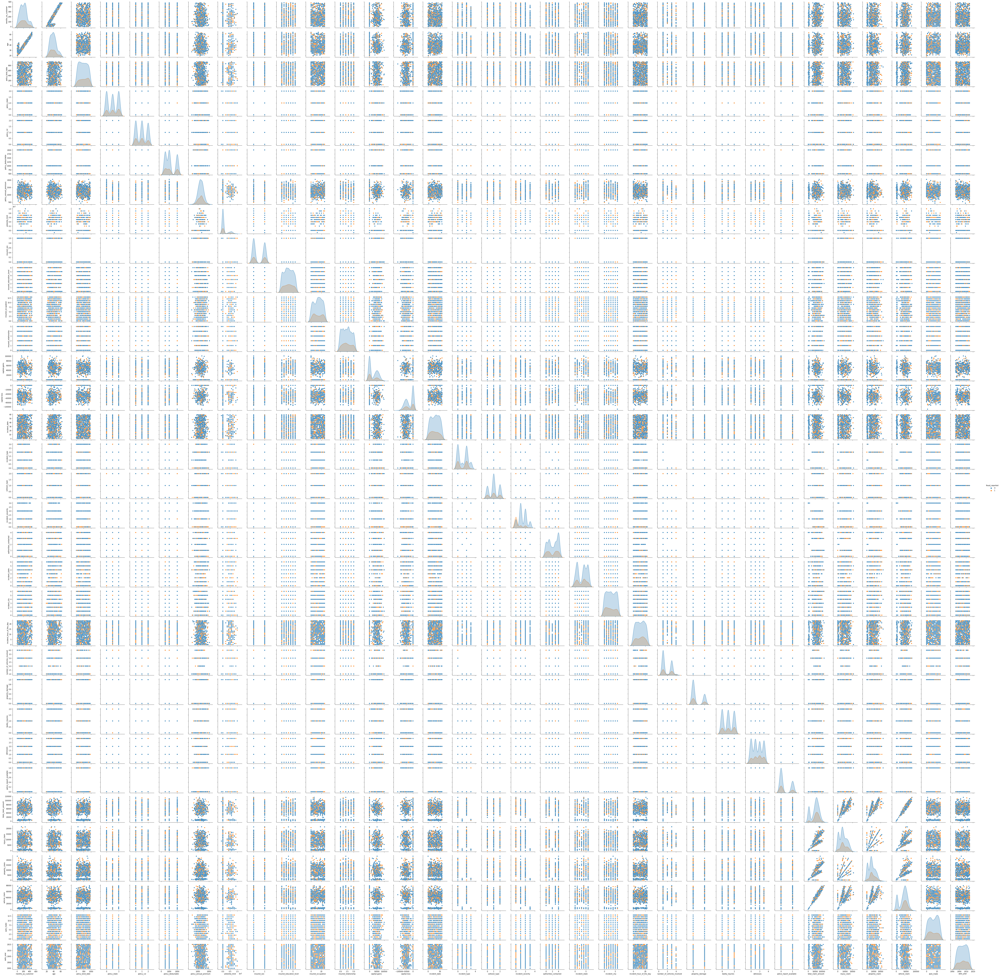

In [83]:
sn.pairplot(df,hue='fraud_reported')

##### Solving class imbalance

In [126]:
print('Number of fraud_reported status yes are:',df['fraud_reported'].value_counts()[0])
print('Number of fraud_reported status no are:',df['fraud_reported'].value_counts()[1])
print('Unbalanced dataset' if df['fraud_reported'].value_counts()[0]!=df['fraud_reported'].value_counts()[1] else 'Balanced dataset')

Number of fraud_reported status yes are: 753
Number of fraud_reported status no are: 247
Unbalanced dataset


In [128]:
dfmin=df[df['fraud_reported']==1]
dfmax=df[df['fraud_reported']==0]
dfminup=resample(dfmin,replace=True,n_samples=753,random_state=123)
dff=pd.concat([dfmax, dfminup])
print('Number of fraud_reported status yes are:',dff['fraud_reported'].value_counts()[0])
print('Number of fraud_reported status no are:',dff['fraud_reported'].value_counts()[1])
print('Unbalanced dataset' if dff['fraud_reported'].value_counts()[0]!=dff['fraud_reported'].value_counts()[1] else 'Balanced dataset')

Number of fraud_reported status yes are: 753
Number of fraud_reported status no are: 753
Balanced dataset


### Correlation

In [133]:
dff.corr()['fraud_reported'].sort_values(ascending=False)

fraud_reported                 1.000000
vehicle_claim                  0.202492
total_claim_amount             0.191870
property_claim                 0.152930
injury_claim                   0.092831
policy_state                   0.087555
insured_relationship           0.060811
witnesses                      0.060306
number_of_vehicles_involved    0.059804
policy_bind_date               0.054643
umbrella_limit                 0.048799
property_damage                0.034354
insured_sex                    0.029274
incident_hour_of_the_day       0.025306
bodily_injuries                0.016234
months_as_customer             0.013055
auto_year                      0.010535
capital-loss                   0.008096
policy_deductable              0.005973
insured_education_level        0.002370
age                           -0.000727
insured_occupation            -0.008893
collision_type                -0.009897
policy_annual_premium         -0.015835
capital-gains                 -0.016810


<AxesSubplot:>

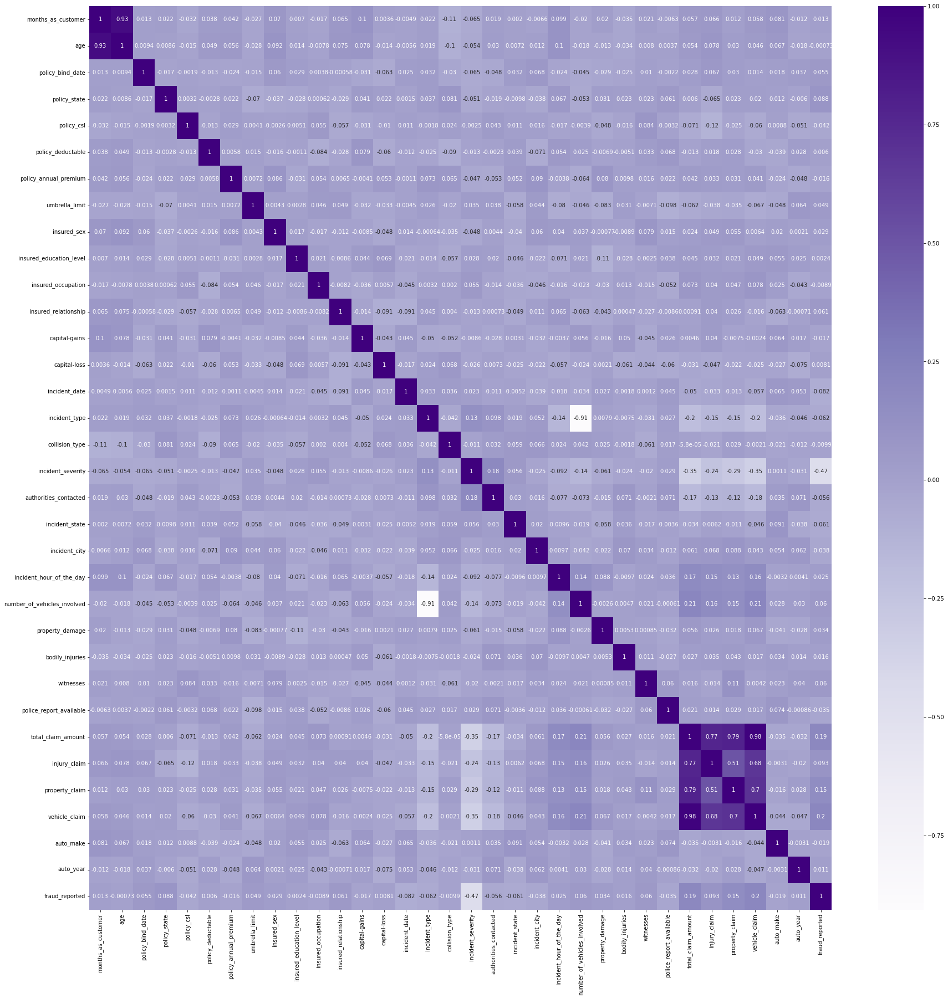

In [130]:
plt.figure(figsize=[30,30])
sn.heatmap(dff.corr(),annot=True,cmap='Purples')

<AxesSubplot:>

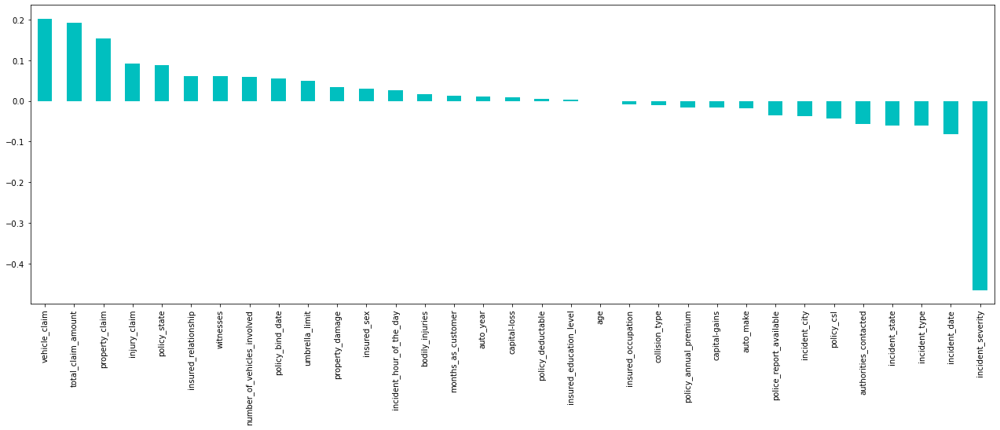

In [131]:
plt.figure(figsize=(22,7))
dff.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='c')

##### Will drop the least correlated columns

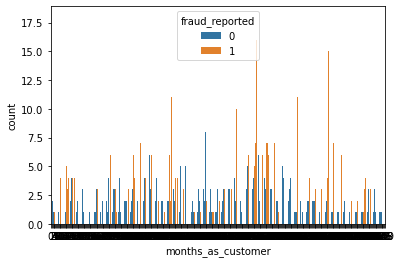

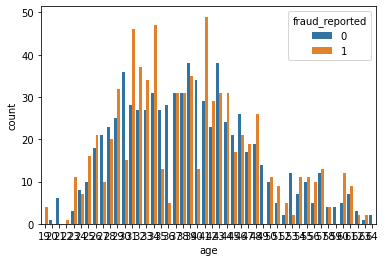

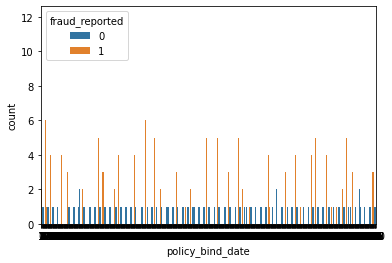

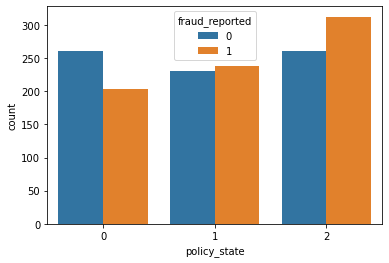

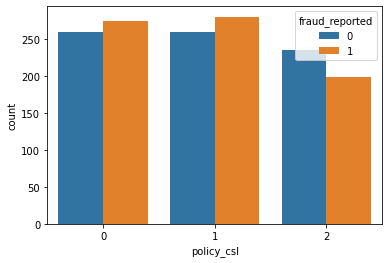

...

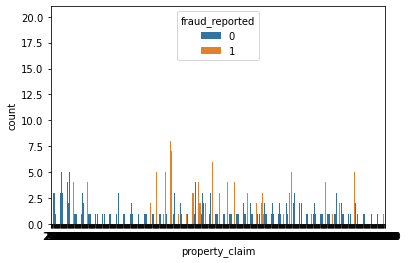

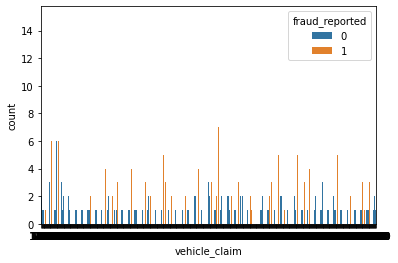

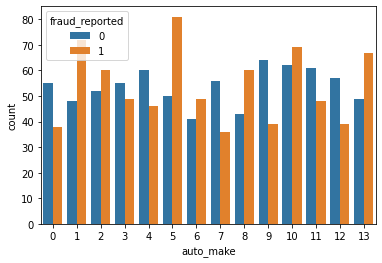

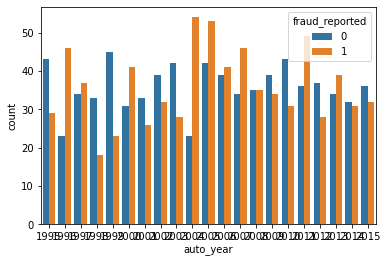

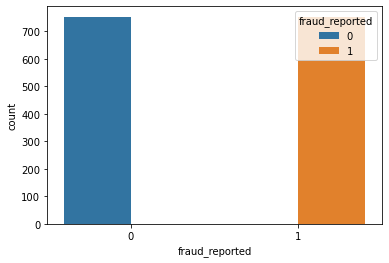

In [132]:
for i in dff.columns:
    sn.countplot(x=i,hue="fraud_reported",data=dff)
    plt.show()

### Acc to above plot, policy dectuable, umbrella limit,insured sex, incident date, number of vehicles involved, bodily injuries, police report available columns are unable to distinguish between attrition yes and no. Meaning it does not provide much impact to the model. drop columns

In [134]:
dff=dff.drop(['policy_deductable','umbrella_limit','insured_sex','incident_date','number_of_vehicles_involved','bodily_injuries',
             'police_report_available','age','insured_occupation','collision_type','insured_education_level','policy_deductable','capital-loss'],axis=1)
dff

,months_as_customer,policy_bind_date,policy_state,policy_csl,policy_annual_premium,insured_relationship,capital-gains,incident_type,incident_severity,authorities_contacted,...,incident_hour_of_the_day,property_damage,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,fraud_reported
2,134,186,2,0,1413.14,3,35100,0,1,4,...,7,0,3,34650,7700,3850,23100,4,2007,0
4,228,181,0,2,1583.91,4,66000,3,1,2,...,20,0,1,6500,1300,650,4550,0,2009,0
6,137,112,1,1,1333.35,0,0,0,1,4,...,0,0,0,78650,21450,7150,50050,9,2012,0
7,165,60,0,0,1137.03,4,0,0,2,4,...,23,0,2,51590,9380,9380,32830,1,2015,0
8,27,132,0,0,1442.99,3,0,2,2,4,...,21,0,1,27700,2770,2770,22160,12,2012,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363,283,778,2,0,1195.01,3,60700,0,0,3,...,13,0,2,42700,0,6100,36600,8,2011,1
143,22,249,1,1,1238.62,2,0,2,0,0,...,14,0,3,70800,7080,14160,49560,0,2012,1
462,448,941,0,0,1376.16,3,38600,0,0,4,...,10,0,1,47760,5970,5970,35820,11,2013,1
529,15,208,1,1,1586.41,2,33500,2,0,4,...,10,1,3,75570,6870,13740,54960,2,2010,1


##### Distribution plots of the columns

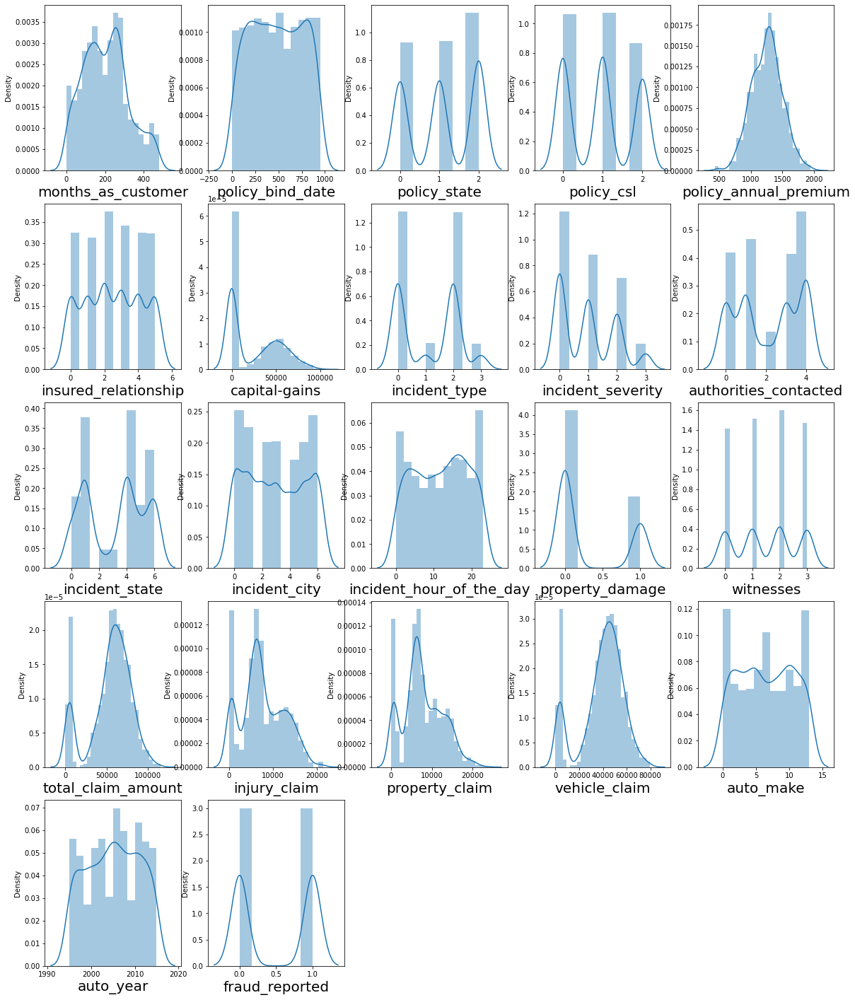

In [135]:
plt.figure(figsize=(20,25),facecolor='white')
plotnumber=1
for column in dff.columns:
    if plotnumber<=len(dff.columns):
        ax=plt.subplot(5,5,plotnumber)
        sn.distplot(dff[column])
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

#### columns having rectangular distribution plot: auto_year, auto_make, incident_hour_of_the_day, incident_city,policy_bind_date
columns having bimodal distribution plot:  policy_state,policy_csl,vehicle_claim,fraud_reported,witnesses,property damage,incident_state,incident severity,insured relationship,
columns having normal distribution plot: policy_annual_premium,month_as_customer,capital gains(skewed),total claim amount,injury claim, property claim, vehicle claim

##### Outliers Check

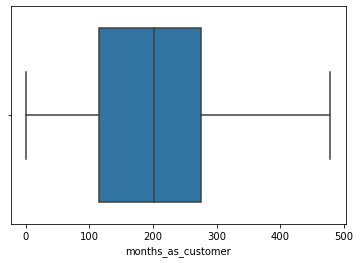

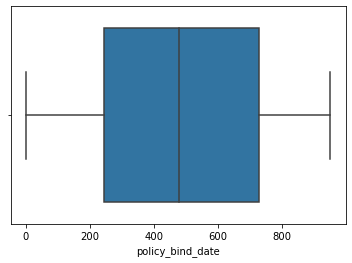

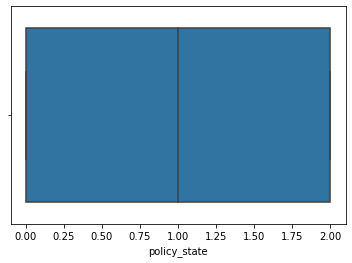

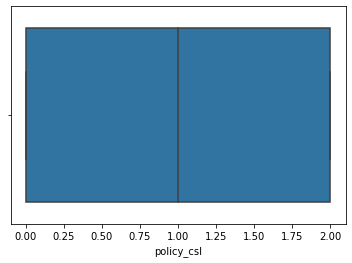

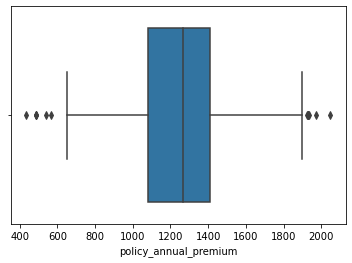

...

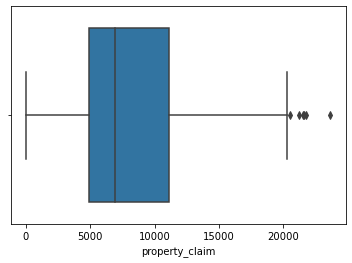

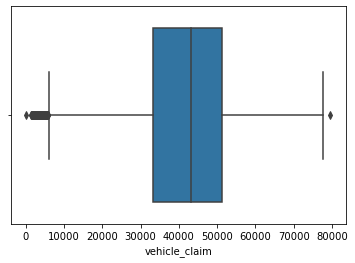

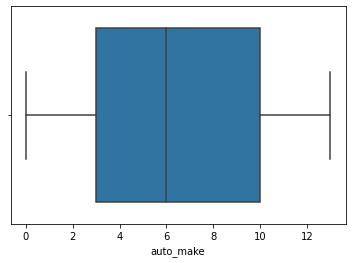

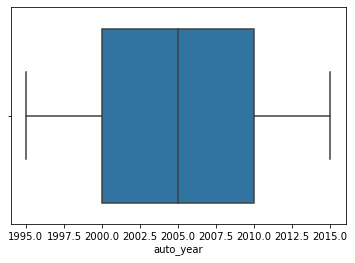

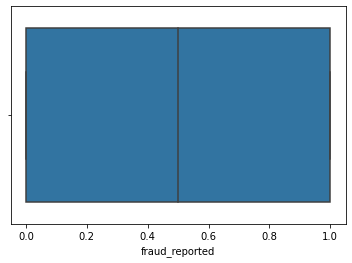

In [136]:
for i in dff.columns:
    sn.boxplot(dff[i])
    plt.show()

##### try to remove outliers

In [137]:
outliers = ['policy_annual_premium','total_claim_amount','property_claim','injury_claim','vehicle_claim']

In [138]:
from scipy.stats import zscore
z=np.abs(zscore(dff[outliers]))
threshold = 3
dff1 = dff[(z<3).all(axis=1)]

In [139]:
print('Shape - Before and After:\n')
print('Shape Before'.ljust(20),":",dff.shape)
print('Shape After'.ljust(20),":",dff1.shape)
print('Percentage Loss'.ljust(20),":",((dff.shape[0]-dff1.shape[0])/dff.shape[0])*100)

Shape - Before and After:

Shape Before         : (1506, 22)
Shape After          : (1500, 22)
Percentage Loss      : 0.398406374501992


In [140]:
Q1 = dff[outliers].quantile(0.25)
Q3 = dff[outliers].quantile(0.75)
IQR = Q3-Q1

dff_1 = dff[~((dff[outliers] < (Q1-1.5*IQR)) | (dff[outliers]> (Q3 + 1.5*Q3))).any(axis = 1)]

In [142]:
print('Shape - Before and After:\n')
print('Shape Before'.ljust(20),":",dff.shape)
print('Shape After'.ljust(20),":",dff_1.shape)
print('Percentage Loss'.ljust(20),":",((dff.shape[0]-dff_1.shape[0])/dff.shape[0])*100)

Shape - Before and After:

Shape Before         : (1506, 22)
Shape After          : (1301, 22)
Percentage Loss      : 13.612217795484726


##### Choosing Z-score methode as data loss is less than 10% 

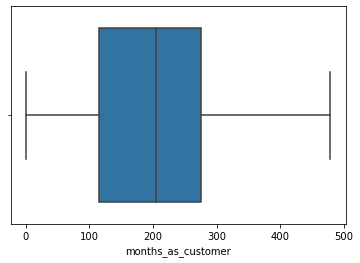

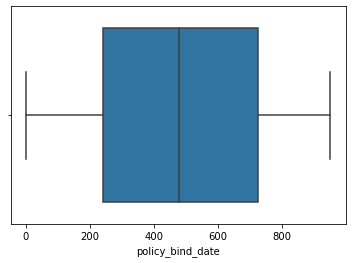

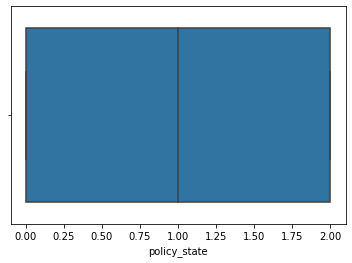

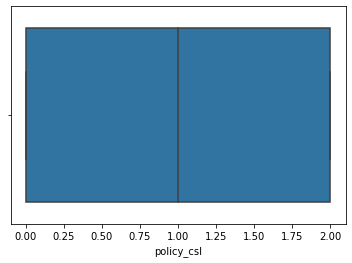

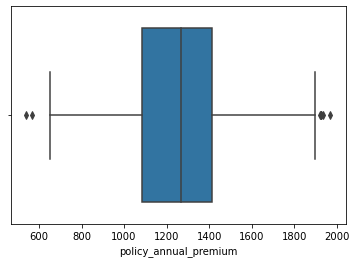

...

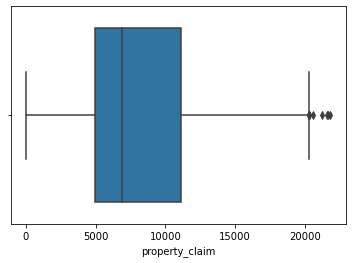

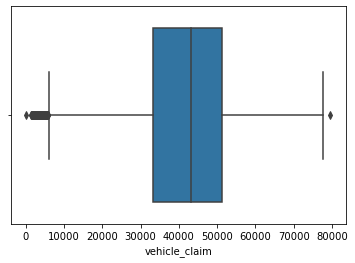

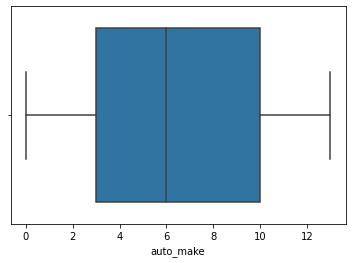

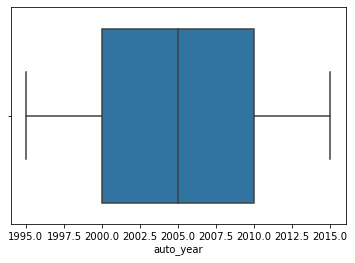

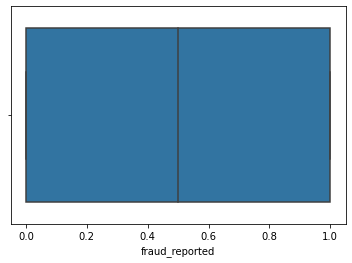

In [143]:
for i in dff1.columns:
    sn.boxplot(dff1[i])
    plt.show()

##### seperate target variable and features

In [146]:
y = dff1[['fraud_reported']].values
x = dff1.drop(columns = ['fraud_reported'])

##### Skewness Check

In [147]:
print(x.skew())
print(len(x.skew().loc[x.skew()>0.55]))

months_as_customer          0.301545
policy_bind_date            0.003069
policy_state               -0.137205
policy_csl                  0.123836
policy_annual_premium       0.058005
insured_relationship        0.005345
capital-gains               0.534117
incident_type               0.074749
incident_severity           0.536743
authorities_contacted      -0.083345
incident_state             -0.120288
incident_city               0.059925
incident_hour_of_the_day   -0.077247
property_damage             0.798991
witnesses                  -0.027725
total_claim_amount         -0.719555
injury_claim                0.287662
property_claim              0.334361
vehicle_claim              -0.767905
auto_make                   0.007673
auto_year                  -0.063195
dtype: float64
1


In [148]:
for index in x.skew().index:
    if x.skew().loc[index] >0.55:
        x[index]=np.cbrt(x[index])

In [149]:
print(x.skew())
print(len(x.skew().loc[x.skew()>0.55]))

months_as_customer          0.301545
policy_bind_date            0.003069
policy_state               -0.137205
policy_csl                  0.123836
policy_annual_premium       0.058005
insured_relationship        0.005345
capital-gains               0.534117
incident_type               0.074749
incident_severity           0.536743
authorities_contacted      -0.083345
incident_state             -0.120288
incident_city               0.059925
incident_hour_of_the_day   -0.077247
property_damage             0.798991
witnesses                  -0.027725
total_claim_amount         -0.719555
injury_claim                0.287662
property_claim              0.334361
vehicle_claim              -0.767905
auto_make                   0.007673
auto_year                  -0.063195
dtype: float64
1


#### Find the best features using Univariate Selection

In [150]:
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(x,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(x.columns)
#concat two dataframes for better visualization 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Specs','Score']  #naming the dataframe columns
print(featureScores.nlargest(10,'Score'))

                    Specs          Score
15     total_claim_amount  619878.774049
18          vehicle_claim  489838.071057
17         property_claim  103342.308441
16           injury_claim   37978.292953
6           capital-gains   13123.834908
1        policy_bind_date     696.481477
8       incident_severity     303.493075
0      months_as_customer      17.521531
10         incident_state       8.158293
4   policy_annual_premium       7.958318


In [151]:
newdf=x[['total_claim_amount','vehicle_claim','property_claim','injury_claim','capital-gains','policy_bind_date',
        'incident_severity','months_as_customer','incident_state','policy_annual_premium']]
newdf

,total_claim_amount,vehicle_claim,property_claim,injury_claim,capital-gains,policy_bind_date,incident_severity,months_as_customer,incident_state,policy_annual_premium
2,34650,23100,3850,7700,35100,186,1,134,1,1413.14
4,6500,4550,650,1300,66000,181,1,228,1,1583.91
6,78650,50050,7150,21450,0,112,1,137,1,1333.35
7,51590,32830,9380,9380,0,60,2,165,5,1137.03
8,27700,22160,2770,2770,0,132,2,27,6,1442.99
...,...,...,...,...,...,...,...,...,...,...
363,42700,36600,6100,0,60700,778,0,283,6,1195.01
143,70800,49560,14160,7080,0,249,0,22,4,1238.62
462,47760,35820,5970,5970,38600,941,0,448,4,1376.16
529,75570,54960,13740,6870,33500,208,0,15,6,1586.41


In [152]:
scaler = StandardScaler()
newdf[['total_claim_amount','vehicle_claim','property_claim','injury_claim','capital-gains','months_as_customer','policy_annual_premium']] = scaler.fit_transform(newdf[['total_claim_amount','vehicle_claim','property_claim','injury_claim','capital-gains','months_as_customer','policy_annual_premium']])
newdf

,total_claim_amount,vehicle_claim,property_claim,injury_claim,capital-gains,policy_bind_date,incident_severity,months_as_customer,incident_state,policy_annual_premium
2,-0.820707,-0.934899,-0.816598,0.017571,0.358036,186,1,-0.614531,1,0.660489
4,-1.954377,-1.980995,-1.489220,-1.316182,1.449337,181,1,0.203506,1,1.380258
6,0.951281,0.584899,-0.122958,2.883055,-0.881597,112,1,-0.588424,1,0.324187
7,-0.138492,-0.386193,0.345775,0.367681,-0.881597,60,2,-0.344753,5,-0.503271
8,-1.100601,-0.987909,-1.043608,-1.009835,-0.881597,132,2,-1.545701,6,0.786302
...,...,...,...,...,...,...,...,...,...,...
363,-0.496514,-0.173590,-0.343662,-1.587100,1.262156,778,0,0.682144,6,-0.258895
143,0.635142,0.557267,1.350503,-0.111636,-0.881597,249,0,-1.589214,4,-0.075085
462,-0.292735,-0.217577,-0.370987,-0.342959,0.481646,941,0,2.118060,4,0.504624
529,0.827242,0.861790,1.262221,-0.155400,0.301529,208,0,-1.650131,6,1.390795


In [153]:
def besttrain(model,x,y):
    random=0
    score=0
    for i in range(42,200):
        x_train,x_test,y_train,y_test=train_test_split(x,y,random_state = i,test_size=0.20,stratify=y)
        model.fit(x_train,y_train)
        tmp=roc_auc_score(y_test,model.predict(x_test))
        #print(i,tmp)
        if tmp>score:
            score=tmp
            random=i
    print("maximum roc_auc_score is at random state :",random," and it is :",score)

### Model Building & Evaluation

In [157]:
models=[LogisticRegression(),DecisionTreeClassifier(),KNeighborsClassifier(),RandomForestClassifier(),SVC(),RidgeClassifier(),
        BaggingClassifier(),GradientBoostingClassifier(),SGDClassifier(),
       LGBMClassifier(),XGBClassifier(),ExtraTreesClassifier(),AdaBoostClassifier(),LinearSVC(),NuSVC()]

In [158]:
for i in models:
    x_train,x_test,y_train,y_test=train_test_split(newdf,y,random_state = 42,test_size=0.20,stratify=y)
    scores=cross_val_score(i,x_train,y_train,cv=5,scoring='roc_auc')
    score=np.mean(scores)
    i.fit(x_train,y_train)
    y_pred=i.predict(x_test)
    if roc_auc_score(y_test,y_pred)>score:
        diff=roc_auc_score(y_test,y_pred)-score
        print('roc bigger')
    else:
        diff=score-roc_auc_score(y_test,y_pred)
    print('*'*10)
    print(i)
    print('score',score)
    print('roc',roc_auc_score(y_test,y_pred))
    print('diff',diff)

**********
LogisticRegression()
score 0.7845000000000001
roc 0.7133333333333334
diff 0.07116666666666671
roc bigger
**********
DecisionTreeClassifier()
score 0.8516666666666666
roc 0.8866666666666667
diff 0.03500000000000014
**********
KNeighborsClassifier()
score 0.7410277777777777
roc 0.6733333333333333
diff 0.06769444444444439
**********
RandomForestClassifier()
score 0.9586666666666666
roc 0.9266666666666667
diff 0.031999999999999806
**********
SVC()
score 0.5232916666666667
roc 0.5166666666666667
diff 0.006624999999999992
**********
RidgeClassifier()
score 0.7872916666666667
roc 0.7066666666666666
diff 0.08062500000000017
**********
BaggingClassifier()
score 0.9387430555555556
roc 0.9166666666666667
diff 0.022076388888888854
**********
GradientBoostingClassifier()
score 0.8878611111111111
roc 0.8466666666666667
diff 0.04119444444444442
**********
SGDClassifier()
score 0.5302222222222224
roc 0.49999999999999994
diff 0.030222222222222428
**********
LGBMClassifier()
score 0.945875
ro

### LGBMClassifier is the best model 

### HyperParameter Tuning

In [161]:
parameters={'boosting_type':['gbdt', 'dart','goss','rf'],'num_leaves': sp_randint(6, 50),
            'n_estimators':[100,500,1200],'max_depth':list(range(3,56))}
clf = RandomizedSearchCV(LGBMClassifier(), parameters, cv=10,scoring="roc_auc",n_jobs=-1,verbose=1)
clf.fit(newdf,y)
clf.best_params_

Fitting 10 folds for each of 10 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   14.4s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.1min finished


{'boosting_type': 'gbdt',
 'max_depth': 28,
 'n_estimators': 500,
 'num_leaves': 48}

#### finding best random state

In [162]:
besttrain(LGBMClassifier(boosting_type='gbdt',max_depth=28,n_estimators=500,num_leaves=48),newdf,y)

maximum roc_auc_score is at random state : 82  and it is : 0.9466666666666667


#### Fit the best Model

In [163]:
x_train, x_test, y_train, y_test = train_test_split(newdf, y,random_state = 82,test_size=0.20,stratify=y)
model=LGBMClassifier(boosting_type='gbdt',max_depth=28,n_estimators=500,num_leaves=48)
model.fit(x_train,y_train)
y_pred=model.predict(x_test)

### Metrics

In [164]:
print("Confusion matrix \n",confusion_matrix(y_test,y_pred))
print("f1 score is : ",f1_score(y_test,y_pred))
print("classification report \n",classification_report(y_test,y_pred))
print("AUC ROC Score: ",roc_auc_score(y_test,y_pred))
scores=cross_val_score(model,newdf,y,cv=5,scoring='roc_auc')
score=np.mean(scores)
std=np.std(scores)
print('CV mean',score)
print('std:',std)

Confusion matrix 
 [[136  14]
 [  2 148]]
f1 score is :  0.9487179487179487
classification report 
               precision    recall  f1-score   support

           0       0.99      0.91      0.94       150
           1       0.91      0.99      0.95       150

    accuracy                           0.95       300
   macro avg       0.95      0.95      0.95       300
weighted avg       0.95      0.95      0.95       300

AUC ROC Score:  0.9466666666666667
CV mean 0.9675466666666666
std: 0.009421610043005839


##### AUC_ROC CURVE

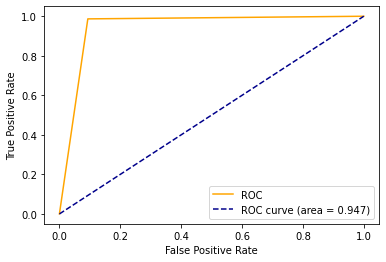

In [165]:
fpr, tpr, threshold = roc_curve(y_test,y_pred)
auc = roc_auc_score(y_test,y_pred)
plt.plot(fpr, tpr, color ='orange', label ='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--', label ='ROC curve (area = %0.3f)'% auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.show()

#### Actual values VS Predicted values with further visual representation

In [168]:
y_pred=model.predict(newdf)
data=dff1.drop(['fraud_reported'],axis=1)
data['Pred']=y_pred
data['fraud_reported']=dff1[['fraud_reported']]
data

,months_as_customer,policy_bind_date,policy_state,policy_csl,policy_annual_premium,insured_relationship,capital-gains,incident_type,incident_severity,authorities_contacted,...,property_damage,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_year,Pred,fraud_reported
2,134,186,2,0,1413.14,3,35100,0,1,4,...,0,3,34650,7700,3850,23100,4,2007,0,0
4,228,181,0,2,1583.91,4,66000,3,1,2,...,0,1,6500,1300,650,4550,0,2009,0,0
6,137,112,1,1,1333.35,0,0,0,1,4,...,0,0,78650,21450,7150,50050,9,2012,0,0
7,165,60,0,0,1137.03,4,0,0,2,4,...,0,2,51590,9380,9380,32830,1,2015,0,0
8,27,132,0,0,1442.99,3,0,2,2,4,...,0,1,27700,2770,2770,22160,12,2012,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
363,283,778,2,0,1195.01,3,60700,0,0,3,...,0,2,42700,0,6100,36600,8,2011,1,1
143,22,249,1,1,1238.62,2,0,2,0,0,...,0,3,70800,7080,14160,49560,0,2012,1,1
462,448,941,0,0,1376.16,3,38600,0,0,4,...,0,1,47760,5970,5970,35820,11,2013,1,1
529,15,208,1,1,1586.41,2,33500,2,0,4,...,1,3,75570,6870,13740,54960,2,2010,1,1


#### Check normal distribution

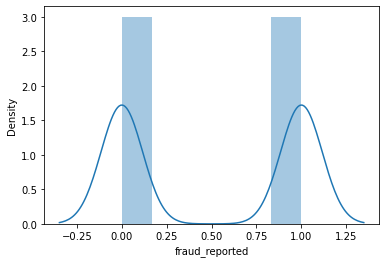

<AxesSubplot:xlabel='Pred', ylabel='Density'>

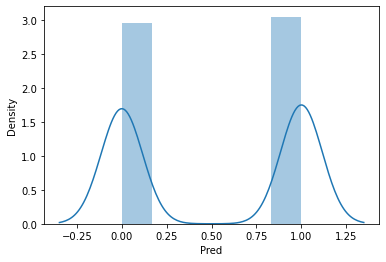

In [169]:
sn.distplot(data['fraud_reported'])
plt.show()
sn.distplot(data['Pred'])

##### Look almost similar

<AxesSubplot:>

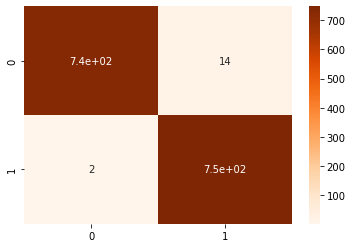

In [170]:
sn.heatmap(confusion_matrix(data['fraud_reported'],data['Pred']),annot=True,cmap="Oranges",xticklabels=model.classes_
               ,yticklabels=model.classes_)

In [172]:
data.fraud_reported.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

In [173]:
data.Pred.value_counts()

1    762
0    738
Name: Pred, dtype: int64

#### Saving the Model

In [174]:
joblib.dump(model, 'fraud.pkl')

['fraud.pkl']